# Exploratory Data Analysis (Solar Irradiance) Data

In [1]:
#Imports
import pandas as pd
import matplotlib.pyplot as plt
import missingno as msno
import seaborn as sns
import numpy as np
import os

In [2]:
df = pd.read_csv('../../data/cleaned_solar_data.csv')
df.head()

,Date,T2M,T2MWET,RH2M,WS10M,PRECTOTCORR,ALLSKY_SFC_SW_DWN,CLRSKY_SFC_SW_DWN,ALLSKY_SFC_SW_DIFF,CLRSKY_SFC_SW_DIFF,ALLSKY_KT,ALLSKY_SFC_PAR_TOT,CLRSKY_SFC_PAR_TOT,ALLSKY_SFC_UVA,ALLSKY_SFC_UVB,ALLSKY_SFC_UV_INDEX,City,State
0,2021-01-01,3.72,2.53,85.00,5.15,16.23,0.96,2.51,0.80,0.48,0.26,17.63,45.16,2.46,0.02,0.12,New York,New York
1,2021-01-02,6.28,5.31,88.00,7.12,3.13,1.83,2.45,0.97,0.63,0.48,32.91,44.13,4.05,0.04,0.20,New York,New York
2,2021-01-03,4.21,3.62,92.56,7.26,8.93,0.50,2.35,0.39,0.80,0.13,9.64,42.30,1.42,0.02,0.08,New York,New York
3,2021-01-04,3.82,2.84,87.44,4.89,0.98,1.67,2.47,1.13,0.65,0.44,29.94,43.72,3.80,0.04,0.18,New York,New York
4,2021-01-05,3.44,2.01,81.69,4.35,0.09,0.95,2.42,0.78,0.75,0.25,17.61,42.23,2.47,0.02,0.11,New York,New York


In [3]:
#Columns should have been reordered earlier, will make a quick correction

columns = ['Date', 'City', 'State', 'T2M', 'T2MWET', 'RH2M', 'WS10M', 'PRECTOTCORR',
           'ALLSKY_SFC_SW_DWN', 'CLRSKY_SFC_SW_DWN', 'ALLSKY_SFC_SW_DIFF', 
           'CLRSKY_SFC_SW_DIFF', 'ALLSKY_KT', 'ALLSKY_SFC_PAR_TOT',
           'CLRSKY_SFC_PAR_TOT', 'ALLSKY_SFC_UVA', 'ALLSKY_SFC_UVB', 'ALLSKY_SFC_UV_INDEX']

df = df[columns]
df.head()

,Date,City,State,T2M,T2MWET,RH2M,WS10M,PRECTOTCORR,ALLSKY_SFC_SW_DWN,CLRSKY_SFC_SW_DWN,ALLSKY_SFC_SW_DIFF,CLRSKY_SFC_SW_DIFF,ALLSKY_KT,ALLSKY_SFC_PAR_TOT,CLRSKY_SFC_PAR_TOT,ALLSKY_SFC_UVA,ALLSKY_SFC_UVB,ALLSKY_SFC_UV_INDEX
0,2021-01-01,New York,New York,3.72,2.53,85.00,5.15,16.23,0.96,2.51,0.80,0.48,0.26,17.63,45.16,2.46,0.02,0.12
1,2021-01-02,New York,New York,6.28,5.31,88.00,7.12,3.13,1.83,2.45,0.97,0.63,0.48,32.91,44.13,4.05,0.04,0.20
2,2021-01-03,New York,New York,4.21,3.62,92.56,7.26,8.93,0.50,2.35,0.39,0.80,0.13,9.64,42.30,1.42,0.02,0.08
3,2021-01-04,New York,New York,3.82,2.84,87.44,4.89,0.98,1.67,2.47,1.13,0.65,0.44,29.94,43.72,3.80,0.04,0.18
4,2021-01-05,New York,New York,3.44,2.01,81.69,4.35,0.09,0.95,2.42,0.78,0.75,0.25,17.61,42.23,2.47,0.02,0.11


### Summary Statistics

In [4]:
summary_stats = df.describe()
print(summary_stats)

                 T2M         T2MWET           RH2M          WS10M  \
count  237200.000000  237200.000000  237200.000000  237200.000000   
mean       15.583698      11.761285      67.201611       3.532009   
std         9.860841       9.033778      19.757388       1.697987   
min       -28.850000     -29.450000       3.440000       0.340000   
25%         8.770000       5.400000      56.620000       2.290000   
50%        16.090000      12.200000      71.940000       3.140000   
75%        23.440000      18.900000      81.750000       4.380000   
max        39.890000      28.870000     100.000000      17.090000   

         PRECTOTCORR  ALLSKY_SFC_SW_DWN  CLRSKY_SFC_SW_DWN  \
count  237200.000000      237200.000000      237200.000000   
mean        2.298049           4.689694           5.786153   
std         6.109825           2.137052           1.887883   
min         0.000000           0.100000           0.200000   
25%         0.000000           3.050000           4.110000   
50%   

### Data Visualization

##### Distribution of some weather-related variables

In [6]:
#First let's create a list of variables

variables = [
    'T2M', 'T2MWET', 'RH2M', 'WS10M', 'PRECTOTCORR',
    'ALLSKY_SFC_SW_DWN', 'CLRSKY_SFC_SW_DWN', 'ALLSKY_SFC_SW_DIFF', 
    'CLRSKY_SFC_SW_DIFF', 'ALLSKY_KT', 'ALLSKY_SFC_PAR_TOT',
    'CLRSKY_SFC_PAR_TOT', 'ALLSKY_SFC_UVA', 'ALLSKY_SFC_UVB', 'ALLSKY_SFC_UV_INDEX'
]

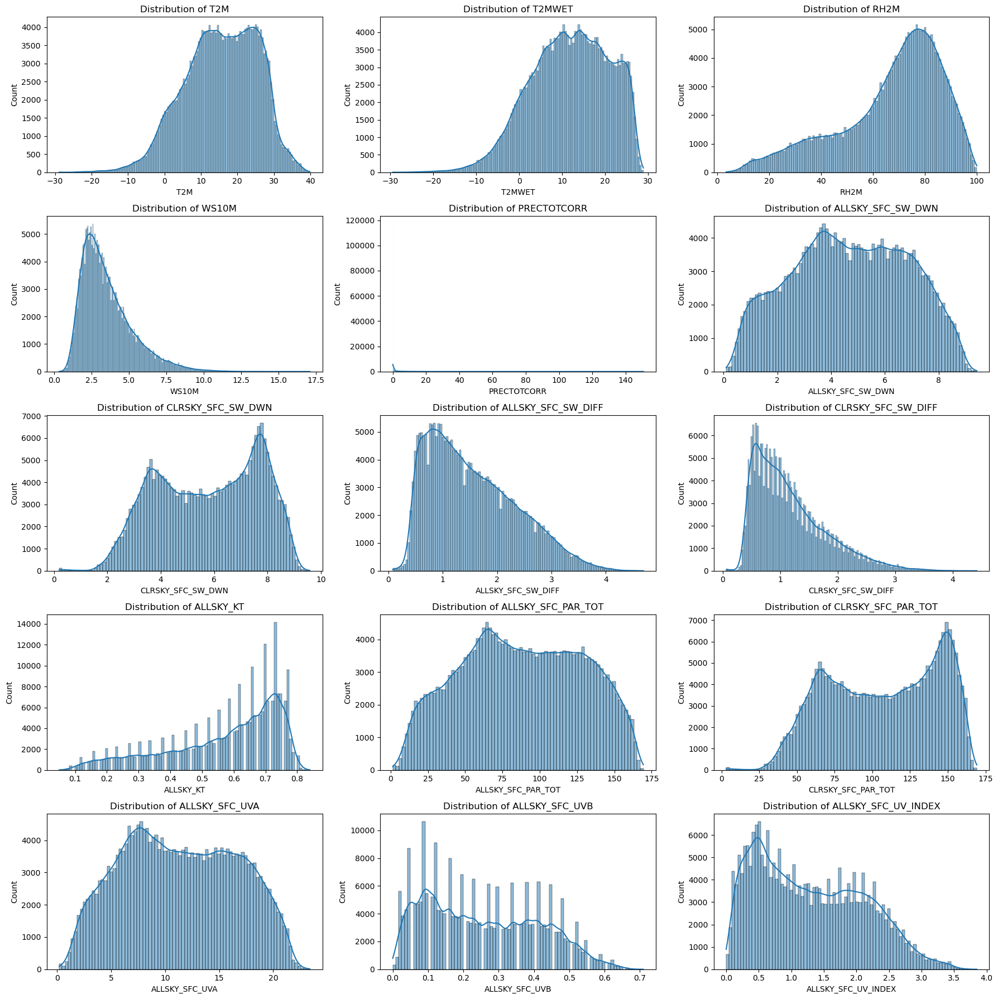

In [7]:

plt.figure(figsize=(18, 18))
for i, var in enumerate(variables, 1):
    plt.subplot(5, 3, i)
    sns.histplot(df[var], kde=True)
    plt.title(f'Distribution of {var}')
plt.tight_layout()
plt.show()

##### Let's look at the relationships between these features

C:\Users\darde\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


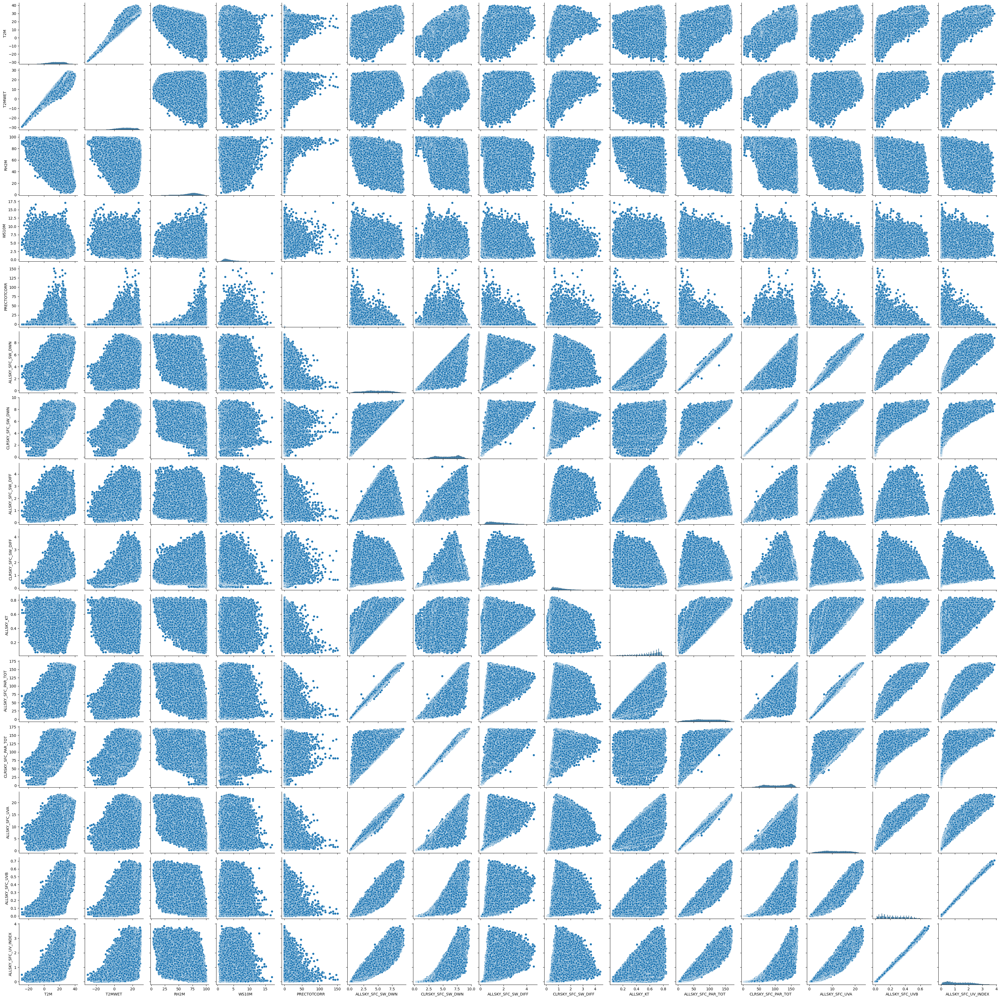

In [8]:
sns.pairplot(df[variables])
plt.show()

###### notes: 

There is a clear linear relationship between some variables, such as ALLSKY_SFC_SW_DWN and CLRSKY_SFC_SW_DWN. Similar to UVB,VUA and UV_Index. 

Some are non-linear such as T2M but there maybe some curvature, it could be that higher temparatures can impact certain features. 

Some variables show district clusters and varying spreads, which might be due to different wather patterns/cities/seasons

##### Correlation Matrix

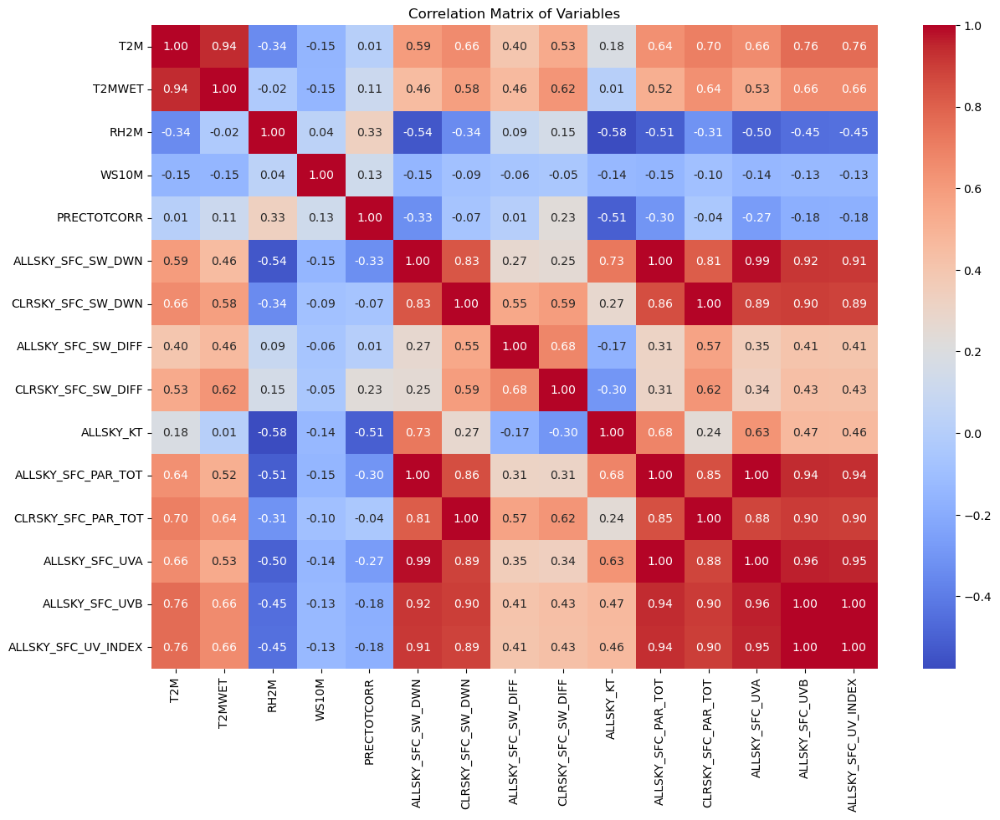

In [9]:
corr_matrix = df[variables].corr()

plt.figure(figsize=(14, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix of Variables')
plt.show()

###### notes
High correlation with Allsky_sfc_sw_down and CLRSKY_SFC_SW_DWN. Same goes for UVB, UVA and UV_Index. Also for T2M and AllSKY_SFC_UV_INDEX

Moderate Corr for ALLSKY_SFC_SW_DWN and ALLSKY_SFC_PAR_TOT and CLRSKY_SFC_PAR_TOT. Makes sense as Total Photosynthetically active ration (PAR) is closely related to solar irradiance. T2M and ALLSKY_SFC_PAR_TOT also have a correlation, higher temp show higher levels of PAR

Low/Negative Cor with RH2M and ALLSKY_SFC_SW_DWN. This could be because higher humidity levels might be associated with lower solar irradiance. Possibly due to cloud cover or moisture. WS10M which is windspeed, this shows low corr with other variables, so it is relatively independent of the other weather metrics in this dataset. 

### Trend analysis. 

##### Review over time



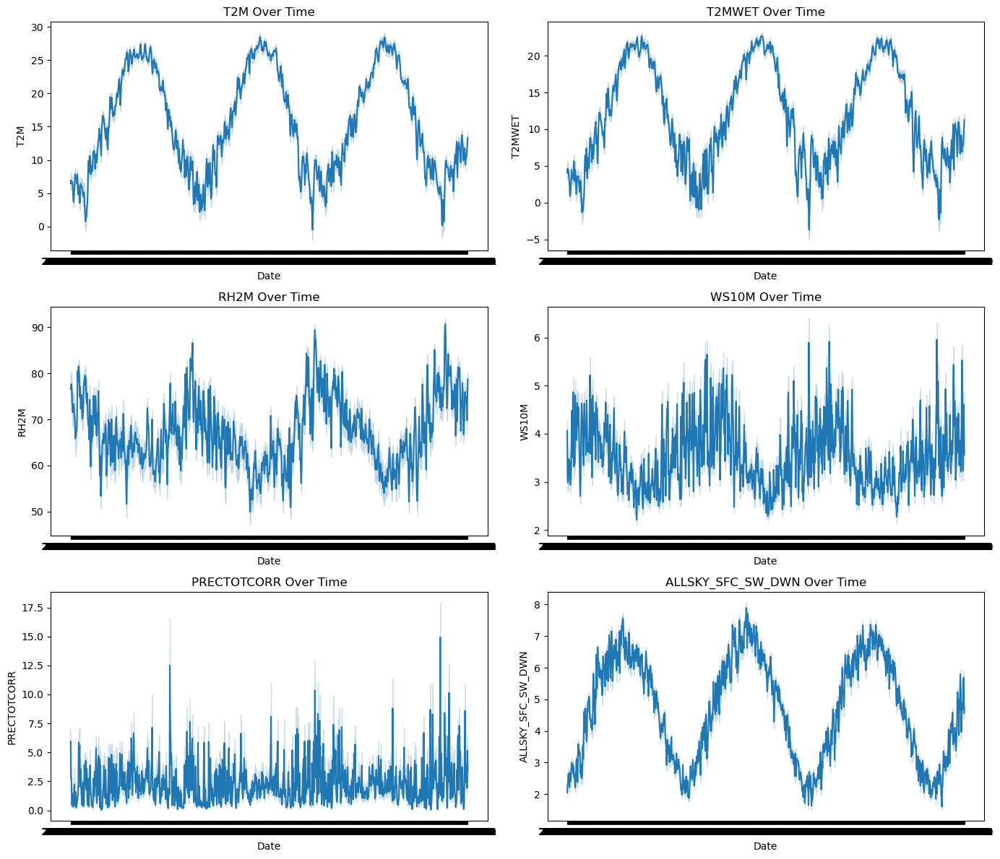

In [11]:
plt.figure(figsize=(14, 12))
for i, var in enumerate(variables[:6], 1):
    plt.subplot(3, 2, i)
    sns.lineplot(x='Date', y=var, data=df)
    plt.title(f'{var} Over Time')
    plt.xlabel('Date')
    plt.ylabel(var)
plt.tight_layout()
plt.show()

The dates above are difficult to read but there is an obvious pattern across all features. 

### City-Level Analysis
##### We will compare the metrics across different cities and identify regions with the highest potential for solar energy yield

In [15]:
city_stats = df.groupby('City')[variables].mean().sort_values(by='ALLSKY_SFC_UV_INDEX', ascending=False)
print(city_stats)


                 T2M     T2MWET       RH2M     WS10M  PRECTOTCORR  \
City                                                                
Honolulu   24.794992  22.412327  75.123196  6.340388     2.223002   
El Paso    17.394098   9.052184  38.161796  3.986830     0.597293   
Tucson     17.425211   9.405616  40.992395  3.525219     1.022049   
Miami      25.880295  23.598339  76.230017  4.772791     3.387782   
Hialeah    25.880295  23.598339  76.230017  4.772791     3.387782   
...              ...        ...        ...       ...          ...   
Milwaukee   8.372782   6.216138  77.423449  4.964680     2.191248   
Bellevue   10.430843   8.953061  83.763255  2.036391     3.539115   
Tacoma     10.430843   8.953061  83.763255  2.036391     3.539115   
Seattle    10.430843   8.953061  83.763255  2.036391     3.539115   
Anchorage   0.955531  -0.123870  87.466610  2.844545     2.538769   

           ALLSKY_SFC_SW_DWN  CLRSKY_SFC_SW_DWN  ALLSKY_SFC_SW_DIFF  \
City                           

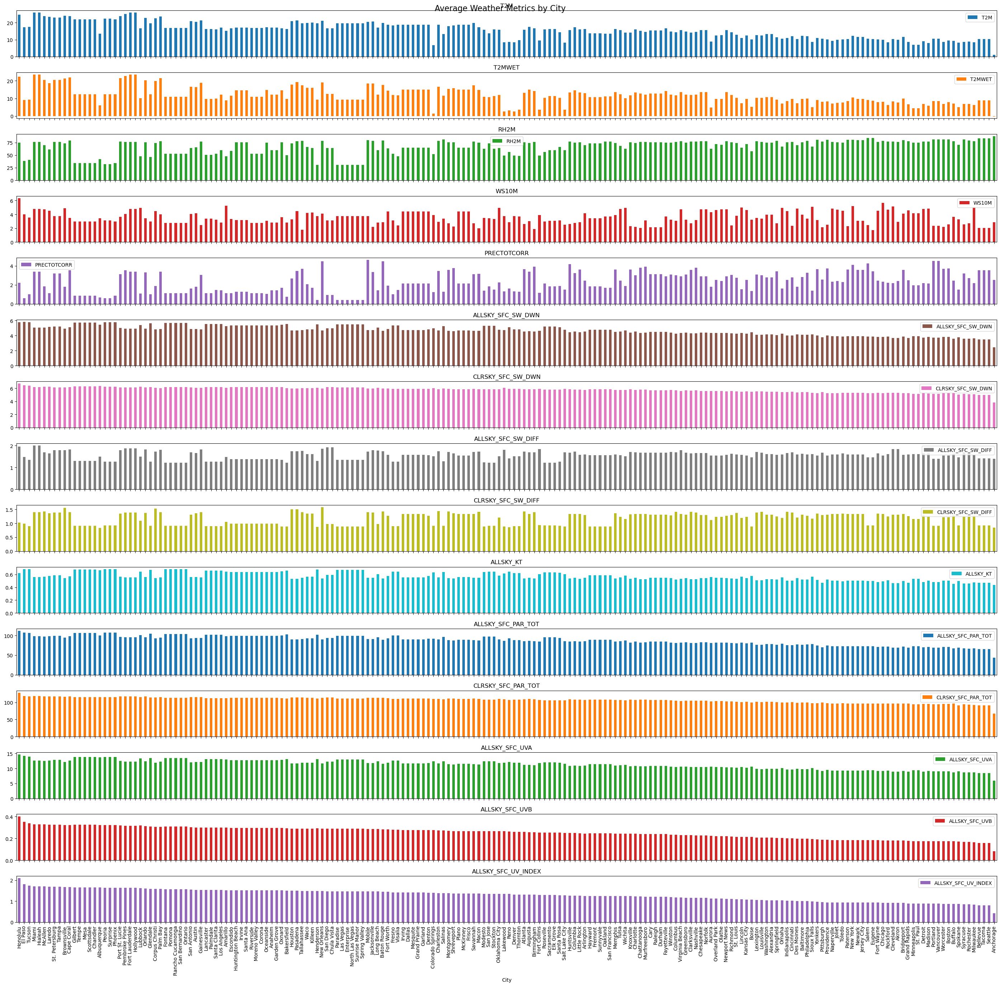

In [22]:


city_stats.plot(kind='bar', figsize=(28, 28), subplots=True, layout=(15, 1))
plt.suptitle('Average Weather Metrics by City', fontsize=16)
plt.tight_layout()
plt.show()

###### Notes:

T2m and T2MWET have noticeable differences in average temperatures across cities.

Relative humity levels vary significantly between cities

Wind Speed also varies across cities. Some cities have higher average windspeed which could be a factor as high winds could potentially damage the solar panels. 

Precipitation (Prectotcorr) shows cities with high average precipitation which can also affect solar energy due to reduced sunlight

ALLSKY_SFC_SW_DWN and CLRSKY_SFC_SWW_DWN these are Solar irradiance valeus that are critical factors for solar energy potential. Cities with higher average values for these are likely better candidates for solar energy projects. 

UV Index varies across cities as well. Higher UV can mean higher solar potential. 